# Práctica 7 - Parte 2: GMM como Proceso Generativo


### Versión 1.0


### Nombre: David Jiménez Omeñaca


### Fecha: 10/4/2025



Librerías que emplearemos en la práctica (puedes importar más si lo consideras necesario):


In [3]:
from math import pi

import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from tqdm import tqdm

# descomenta %matplotlib qt si prefieres plots interactivos
# %matplotlib qt

Funciones auxiliares para visualizar resultados en 3D usando [`plotly`](https://plotly.com/python/):

In [4]:
def visualize_subset_in_grid(
    images,
    subset=25,
    random=False,
    ncols=None,
    figsize=None,
    fig=None,
    ax=None,
):
    """Visualiza un subset de imágenes en una cuadrícula.

    Args:
        images: (n, 784) array con n imágenes 28x28 de Fasion-MNIST.
        subset: Si es un integer, número de imágenes a visualizar, si es una secuencia
            de enteros, visualiza las imágenes con esos índices.
        random: Si True y subset es un entero, las imágenes se seleccionarán
            aleatoriamente.
        ncols: Número de columnas de la cuadrícula. Si es None, se usará una grid
            cuadrada.
        figsize: (w, h) Tamaño de la figura.
        fig: Figura de matplotlib en la que visualizar las imágenes. Si es None, se
            creará una nueva figura.
        ax: Array de ejes de matplotlib en los que visualizar las imágenes. Si es None,
            se crearán nuevos ejes.
    """
    assert images.shape[1] == 784, "Las imágenes deben ser de 28x28 píxeles."

    if isinstance(subset, int):
        subset = min(subset, images.shape[0])
        if random:
            subset = np.random.choice(images.shape[0], subset, replace=False)
        else:
            subset = np.arange(subset)

    n = len(subset)
    if ncols is None:
        ncols = int(np.ceil(np.sqrt(n)))
    nrows = int(np.ceil(n / ncols))

    if fig is None or ax is None:
        fig, ax = plt.subplots(nrows, ncols, figsize=figsize)
    for i, axi in zip(subset, ax.ravel()):
        axi.imshow(images[i].reshape(28, 28), cmap="gray")
        # axi.axis("off")

    for axi in ax.ravel():
        axi.set(xticks=[], yticks=[])

    fig.tight_layout()
    return fig, ax


def plotly_3d_points(fig, points, row=None, col=None, marker_cfg=None):
    """Plot de puntos 3D con plotly

    Args:
        fig: figura de plotly
        points: (n, 3) array con los puntos RGB
    """
    # assert points.shape[1] == 3, "Los puntos deben tener shape (n, 3)"

    # define and update default marker properties
    m_cfg = dict(
        color=points / 255,
        size=3.0,
        opacity=1.0,
        symbol="square",
        line_color="white",
        line_width=0.1,
    )
    m_cfg = {**m_cfg, **(marker_cfg or {})}

    fig.add_trace(
        go.Scatter3d(
            x=points[:, 0],
            y=points[:, 1],
            z=points[:, 2],
            mode="markers",
            marker=m_cfg,
            # name="3D points",
            showlegend=False,
        ),
        row=row,
        col=col,
    )


def plotly_kmeans_results_3d(fig, kmeans, X, row=None, col=None, c_per_cluster=None):
    """Visualización de los resultados de KMeans con datos 3D"""
    means = kmeans.cluster_centers_
    if c_per_cluster is None:
        # c_per_cluster = means / 255
        c_per_cluster = (means - means.min(axis=0)) / np.ptp(means, axis=0)

    labels = kmeans.predict(X)
    for i, (mean, color) in enumerate(zip(means, c_per_cluster)):
        X_cluster = X[labels == i]
        m_cfg_point = {
            "color": np.repeat(color[None], X_cluster.shape[0], axis=0),
            "size": 0.5,
            # "opacity": 0.1,
            "line_width": None,
        }
        m_cfg_means = {"size": 8.0, "symbol": "circle"}
        plotly_3d_points(fig, X_cluster, row=row, col=col, marker_cfg=m_cfg_point)
        plotly_3d_points(fig, mean[None], row=row, col=col, marker_cfg=m_cfg_means)


def plotly_add_ellipsoids(
    fig, covs, centers, colors, std_factors=(1, 2, 3), row=None, col=None
):
    """Muestra elipsoides 3D con plotly

    Args:
        fig: figura plotly.
        covs: (ncovs, 3, 3) matrices de covarianza para cada elipsoide.
        centers: (ncovs, 3) centros de los elipsoides.
        colors: (ncovs, 3) colores para cada elipsoide en RGB.
        std_factor: factor para controlar el tamaño de los elipsoides.
    """
    assert covs.shape[-2:] == (3, 3) and covs.ndim == 3
    assert centers.shape[-1] == 3 and centers.ndim == 2
    std_factors = np.sort(std_factors)
    alphas = np.linspace(0.6, 0.1, len(std_factors))

    # sampling de puntos en la esfera unitaria
    n = 20  # controla la resolución de la malla esférica
    # longitud (theta) y latitud (phi)
    theta = np.linspace(-pi, pi, n)
    phi = np.linspace(-0.5 * pi, 0.5 * pi, n)
    theta, phi = np.meshgrid(theta, phi)
    # coordenadas Cartesianas
    x = np.cos(phi) * np.cos(theta)
    y = np.cos(phi) * np.sin(theta)
    z = np.sin(phi)
    sphere = np.stack((x, y, z), axis=0)
    sphere_r = sphere.reshape(3, -1)

    # puntos en esfera unitaria -> puntos en elipsoides correspondientes a las covs
    vars_, evecs = np.linalg.eigh(covs)
    stds = np.sqrt(vars_)
    ellipsoids = evecs @ (stds[..., None] * sphere_r)  # (ncovs, 3, n*n)
    ellipsoids = ellipsoids.reshape((covs.shape[0], *sphere.shape))  # (ncovs, 3, n, n)

    for std_f, alpha in zip(std_factors, alphas):
        # scale and add offset (centers)
        ellipsoids_ = std_f * ellipsoids + centers[:, :, None, None]

        for ell, color in zip(ellipsoids_, colors):
            color = (color * 255).astype(int).clip(0, 255)
            data = go.Mesh3d(
                x=ell[0].ravel(),
                y=ell[1].ravel(),
                z=ell[2].ravel(),
                alphahull=0,
                opacity=alpha,
                color=f"rgb({color[0]}, {color[1]}, {color[2]})",
            )
            fig.add_trace(data, row=row, col=col)


def plotly_gmm_results_3d(
    fig,
    X,
    gmm,
    pca=None,
    c_per_component=None,
    show_covs=True,
    std_factors=(1,),
    pca3_layout=True,
    means_to_show=8,
    row=None,
    col=None,
):
    """Plot de los resultados de GMM en 3D

    Esta función, emplea plotly para:
    1) mostrar en 3D los puntos correspondientes a las 3 primeras dimensiones de los
        datos de entrada X.
    2) mostrar, como elipsoides, las distribuciones Gaussianas (sus 3 primeras dimensiones)
        ajustadas por el modelo GMM.
    3) opcionalmente, visualizar como imágenes las medias de las componentes Gaussianas.
        Si estas medias están expresadas en un espacio de dimenionalidad reducidad
        (transformadas con PCA), el correspondiente objeto de PCA debe ser proporcionado
        en el argumento pca.

    Args:
        fig: figura de plotly
        X: (n_samples, d) datos de entrada
        gmm: GaussianMixture ajustada
        pca: objeto PCA para (des)transformar las medias de las componentes Gaussianas y
            poder visualizarlas como imágenes.
        c_per_component: colores para cada componente Gaussiana. Admite arrays (ncomps, 3)
            con valores RGB en [0, 1]. Si es None, se mapearán las medias a colores RGB.
            show_covs: si True, muestra las elipsoides de covarianza.
        std_factors: factores, sobre la desviación estándar de cada componente Gaussiana,
            para controlar el tamaño de las elipsoides visualizadas.
        pca3_layout: si True, se ajusta el layout para visualizaciones 3D en espacio PCA.
        means_to_show: número de medias de las componentes Gaussianas a visualizar en 2D,
            como pseudo-leyenda.
        row, col: en caso de que la figura sea un subplot, determinan la posición del plot
            en la correspondiente cuadrícula.
    """
    means = gmm.means_
    ncomps = means.shape[0]
    covs = gmm.covariances_
    means3 = means[:, :3]

    if c_per_component is None:
        # map 3D points to RGB colors
        c_per_component = (means3 - means3.min(axis=0)) / np.ptp(means3, axis=0)

    if show_covs:
        # transforma las covarianzas a shape (ncomp, 3, 3)
        if gmm.covariance_type == "spherical":
            covs = np.eye(3)[None] * covs[:, None, None]
        elif gmm.covariance_type == "diag":
            covs = covs[:, :3]
            covs = np.stack([np.diag(cov) for cov in covs])
        elif gmm.covariance_type == "tied":
            covs = covs[:3, :3]
            covs = np.stack([covs] * ncomps)
        elif gmm.covariance_type == "full":
            covs = covs[:, :3, :3]
        else:
            raise ValueError

        plotly_add_ellipsoids(
            fig, covs, means3, c_per_component, std_factors, row=row, col=col
        )

    labels = gmm.predict(X)
    for i, (mean, color) in enumerate(zip(means, c_per_component)):
        X_comp = X[labels == i]
        m_cfg_point = {
            "color": np.repeat(color[None], X_comp.shape[0], axis=0),
            "size": 1.0,
            # "opacity": 0.1,
            "line_width": None,
        }
        m_cfg_means = {"size": 8.0, "symbol": "circle"}
        plotly_3d_points(fig, X_comp[:, :3], row=row, col=col, marker_cfg=m_cfg_point)
        plotly_3d_points(fig, mean[None], row=row, col=col, marker_cfg=m_cfg_means)

    if pca3_layout:
        # modificamos el layout, a uno apropiado para visualizaciones 3D en espacio PCA
        fig.update_layout(
            margin=(
                dict(r=0, l=0) if "scene2" in fig.layout else dict(r=0, b=10, l=0, t=10)
            ),
            hovermode=False,
            plot_bgcolor="white",
        )
        axis_kwargs = dict(showspikes=False, backgroundcolor="white", gridcolor="gray")
        fig.update_scenes(
            xaxis=dict(title="PC1", **axis_kwargs),
            yaxis=dict(title="PC2", **axis_kwargs),
            zaxis=dict(title="PC3", **axis_kwargs),
            # aspectmode="cube",
        )

    # visualización de (means_to_show) medias de las componentes Gaussianas como imágenes
    if pca is not None:
        subset = min(means_to_show, ncomps)
        means_espacio_imagen = pca.inverse_transform(means[:subset]).clip(0, 1)
        fig_, axs = visualize_subset_in_grid(
            means_espacio_imagen,
            subset=subset,
            random=False,
            ncols=subset,
            figsize=(3 * subset, 3),
        )
        # color del frame de cada subplot acorde a la visualización 3D anterior
        for ax, color, mean in zip(
            axs.ravel(), c_per_component[:subset], means_espacio_imagen
        ):
            for spine in ax.spines.values():
                spine.set_edgecolor(color)
                spine.set_linewidth(6)
        fig_.tight_layout()
        plt.show()

    fig.show()

def visualize_subset_in_grid_2(
    images,
    labels,
    predicted_labels=None,
    subset=25,
    esp=True,
    random=True,
    ncols=None,
    fig=None,
    ax=None,
):
    """Visualiza un subset de imágenes en una cuadrícula.

    Args:
        images: (n, 784) array con n imágenes 28x28 de Fasion-MNIST.
        labels: (n,) array con las etiquetas (numéricas) de las n imágenes.
        predicted_labels: (n,) array con las etiquetas predichas por un modelo.
        subset: Si es un integer, número de imágenes a visualizar, si es una secuencia
            de enteros, visualiza las imágenes con esos índices.
        esp: Si True, las etiquetas se mostrarán en español.
        random: Si True y subset es un entero, las imágenes se seleccionarán
            aleatoriamente.
        ncols: Número de columnas de la cuadrícula. Si es None, se usará una grid
            cuadrada.
        fig: Figura de matplotlib en la que visualizar las imágenes. Si es None, se
            creará una nueva figura.
        ax: Array de ejes de matplotlib en los que visualizar las imágenes. Si es None,
            se crearán nuevos ejes.
    """
    assert images.shape[1] == 784, "Las imágenes deben ser de 28x28 píxeles."
    assert len(images) == len(labels), "#imagenes debe coincidir con el de labels."

    if isinstance(subset, int):
        if random:
            subset = np.random.choice(images.shape[0], subset, replace=False)
        else:
            subset = np.arange(subset)

    n = len(subset)
    if ncols is None:
        ncols = int(np.ceil(np.sqrt(n)))
    nrows = int(np.ceil(n / ncols))

    def get_title_and_color(i):
        if predicted_labels is None:
            if isinstance(labels[i], str):
                return labels[i], {"color": "black"}
            else:
                return "", {"color": "black"}

        is_correct = labels[i] == predicted_labels[i]
        symbol = (
            f"\N{HEAVY CHECK MARK}" if is_correct else f"\N{HEAVY MULTIPLICATION X}"
        )
        title = f""
        color = "green" if labels[i] == predicted_labels[i] else "red"
        return title, {"color": color}

    if fig is None or ax is None:
        fig, ax = plt.subplots(nrows, ncols, figsize=(ncols * 2, nrows * 2))
    
    for i, axi in zip(subset, ax.ravel()):
        axi.imshow(images[i].reshape(28, 28), cmap="gray")
        axi.set_title(*get_title_and_color(i))
        axi.axis("off")
    fig.tight_layout()

## 2. GMM como proceso generativo

Una mezcla de Gaussianas (*GMM*) no solo sirve para clusterizar datos. En realidad, GMM, es un <br>
*estimador de densidad*, y por tanto podemos emplearlo para estimar o aproximar la distribución de <br>
probabilidad correspondiente a nuestros datos.

En esta parte de la práctica, vamos a hacer esto mismo sobre las imágenes (datos) de Fashion MNIST <br>
que empleásteis en la práctica anterior. Es decir, vuestro objetivo es estimar una distribución (GMM) <br>
que aproxime/explique las distribución real (desconocida) correspondiente a las imágenes de Fashion MNIST.

Por último, gracias a esta distribución estimada, vamos a poder generar nuevas imágenes, correspondientes <br>
a muestras de esta distribución que, hasta ese momento, no existían. <br>
En otras palabras: vamos a emplear un GMM como un *proceso generativo* de imágenes.

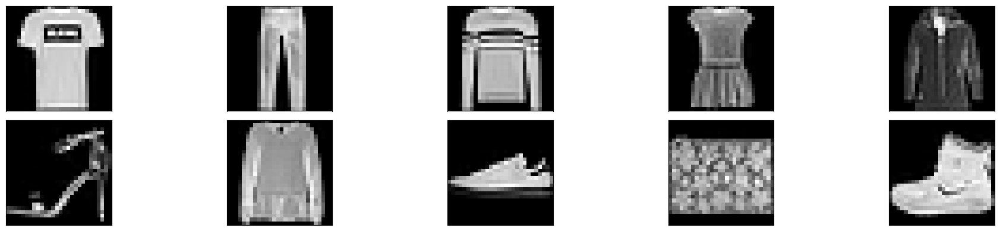

In [5]:
# cargamos el dataset
fashion_mnist = fetch_openml("Fashion-MNIST", parser="pandas")
X = fashion_mnist.data.values / 255  # (70000, 784=28x28) en [0, 1]
y = fashion_mnist.target.values.astype(int)  # (70000,) en [0, 9]
# label mapping
fmnist_labels = labels = {
    0: "Camiseta",
    1: "Pantalón",
    2: "Suéter",
    3: "Vestido",
    4: "Abrigo",
    5: "Sandalia",
    6: "Camisa",
    7: "Zapatilla",
    8: "Bolso",
    9: "Bota",
}
inv_labels = {v: k for k, v in labels.items()}

idx = [np.where(y == i)[0][0] for i in range(10)]


# Imprimir una imagen de cada clase
fig, ax = visualize_subset_in_grid(
    X, subset=idx, random=False, ncols=5, figsize=(20, 4)
)
plt.show()


### 2. a) y b) Ajuste con GMM: BIC vs Nº de componentes Gaussianas
Para mejorar el tiempo de ejecución, vamos a realizar el modelo sobre un subconjunto de datos con reducción de componentes gracias al algoritmo PCA.


In [6]:
from joblib import Parallel, delayed

def gmm_vs_gaussian_components(
    X: np.ndarray,
    gmm_components_to_try: np.ndarray,
    subsample_size: int = 5_000,
    pca_components: float | int = 0.95,
    seed: int = 0,
    verbose: bool = False,
    cov_type: str = "full",
):
    # reduce la cantidad de imágenes a emplear para acelerar cada fit de GMM
    rng = np.random.default_rng(seed)
    idx = rng.choice(X.shape[0], min(subsample_size, X.shape[0]), replace=False)
    X_sub = X[idx]
    if verbose:
        print(f"# imágenes originales: {X.shape[0]}")
        print(f"# imágenes seleccionadas aleatoriamente: {X_sub.shape[0]}")

    # reducción de dimensionalidad con PCA
    pca = PCA()
    pca.fit(X_sub)
    
    explained_variance = pca.explained_variance_ratio_.cumsum()
    if isinstance(pca_components, float):
        min_index = np.min([i for i in range(len(explained_variance)) if explained_variance[i] >= pca_components])
    else:
        min_index = pca_components

    pca = PCA(n_components=min_index)
    pca.fit(X_sub)
    X_pca = pca.transform(X_sub)

    if verbose:
        print(f"Reducción de dimensionalidad con PCA: {X.shape[1]} -> {X_pca.shape[1]}")

    # BIC vs Nº de componentes Gaussianas (parallel version)
    def compute_bic(n_components):
        gmm = GaussianMixture(
            n_components=n_components,
            covariance_type=cov_type,
            random_state=seed,
        )
        gmm.fit(X_pca)
        return gmm.bic(X_pca)

    bics = Parallel(n_jobs=5)(
        delayed(compute_bic)(n) for n in gmm_components_to_try
    )

    plt.plot(gmm_components_to_try, bics, marker="o")
    plt.xlabel("Número de componentes Gaussianas")
    plt.ylabel("BIC")
    plt.title("BIC vs Nº de componentes Gaussianas")
    plt.grid()
    plt.tight_layout()
    plt.show()

    return X_pca, pca


def sample_from_multivariate_gaussian(mean, cov_mat, n_samples, pca):
    """Genera muestras de una distribución Gaussiana multivariante.

    Args:
        mean: media de la distribución.
        cov_mat: matriz de covarianza.
        n_samples: número de muestras a generar.
        pca: objeto PCA para (des)transformar las muestras generadas.

    Returns:
        samples: (n_samples, d) array con las muestras generadas.
    """
    samples = np.random.multivariate_normal(mean, cov_mat, n_samples)
    samples = pca.inverse_transform(samples)  

    return samples.clip(0, 1)  # aseguramos que los valores estén en [0, 1]      


class GmmPca():
    def __init__(self, X, subsample, pca_components, cov_type):
        self.X = X
        self.subsample = subsample
        self.pca_components = pca_components
        self.cov_type = cov_type
        self.gmm = None
        self.pca = None
        self.X_pca = None
        self.num_gmm_comp = None
        self.time_train = None
        
    
    def number_gmm_components(self, gmm_components):
        self.X_pca, self.pca = gmm_vs_gaussian_components(
            self.X,
            gmm_components_to_try=gmm_components,
            subsample_size=self.subsample,
            pca_components=self.pca_components,
            seed=0,
            cov_type=self.cov_type,
        )

    def select_gmm_comp(self, n):
        self.num_gmm_comp = n
        from time import time
        self.time_train = time()
        self.gmm = GaussianMixture(
            n_components=self.num_gmm_comp,
            covariance_type=self.cov_type,
            random_state=0,
        ).fit(self.X_pca)
        self.time_train = time() - self.time_train
        print(f"Tiempo de entrenamiento: {self.time_train:.2f} segundos")
    
    def visualize_pca_comp(self, idx):
        pca_selected_labels = [f"PC{i}" for i in range(0, self.pca.components_.shape[0])]
        visualize_subset_in_grid_2(
            self.pca.components_,
            pca_selected_labels,
            subset = idx,
            ncols=3,
        )
    
    def visualize_samples_gmm(self, n_images_per_component, multiple_cov_mat=False, is_diagonal=False, ncols=5):
        
        assert self.num_gmm_comp is not None, "GMM components not selected. Call select_gmm_comp() first."
        
        imgs = np.empty((0, 28*28))

        print(self.gmm.covariances_.shape)
        
        if multiple_cov_mat and is_diagonal:
            covs = np.array([np.diag(cov) for cov in self.gmm.covariances_])
        elif multiple_cov_mat and not is_diagonal:
            covs = self.gmm.covariances_
        elif not multiple_cov_mat and is_diagonal:
            covs = np.array([np.diag(self.gmm.covariances_)] * self.num_gmm_comp)
        elif not multiple_cov_mat and not is_diagonal:
            covs = np.array([self.gmm.covariances_] * self.num_gmm_comp)
        else:
            raise ValueError("Invalid combination of multiple_cov_mat and is_diagonal.")


        for mean, cov in zip(self.gmm.means_, covs):
            samples = sample_from_multivariate_gaussian(mean, cov, n_images_per_component, self.pca)
            imgs = np.vstack((imgs, samples))

        visualize_subset_in_grid(
            np.array(imgs),
            subset=n_images_per_component * self.num_gmm_comp,
            random=False,
            ncols=ncols,
            figsize=(10, 10),
        )
        plt.show()
    
    def visualize_samples_one_component(self, id_component, num_samples, multiple_cov_mat=False, ncols=5):
        mean = self.gmm.means_[id_component]
        cov = self.gmm.covariances_[id_component] if multiple_cov_mat else self.gmm.covariances_
        samples = sample_from_multivariate_gaussian(mean, cov, num_samples, self.pca)

        visualize_subset_in_grid(
            np.array(samples),
            subset=num_samples,
            random=False,
            ncols=ncols,
            figsize=(10, 10),
        )
        plt.show()
    
    def plot3d(self, c_per_component=None, show_covs=True, std_factors=(1, 2, 3), pca3_layout=True, means_to_show=8):
        fig = go.Figure()
        plotly_gmm_results_3d(
            fig,
            self.X_pca,
            self.gmm,
            pca=self.pca,
            c_per_component=c_per_component,
            show_covs=show_covs,
            std_factors=std_factors,
            pca3_layout=pca3_layout,
            means_to_show=means_to_show,
        )


Ahora vamos a obtener el mejro número de componenetes gaussianas a utilizar para ajustar la distribución de Fashion-MNIST, empleando:
1. Las 3 componentes más principales de los datos, 
2. Un subconjunto de 5000 imágenes.
3. Covarianzas de tipo `tied` 

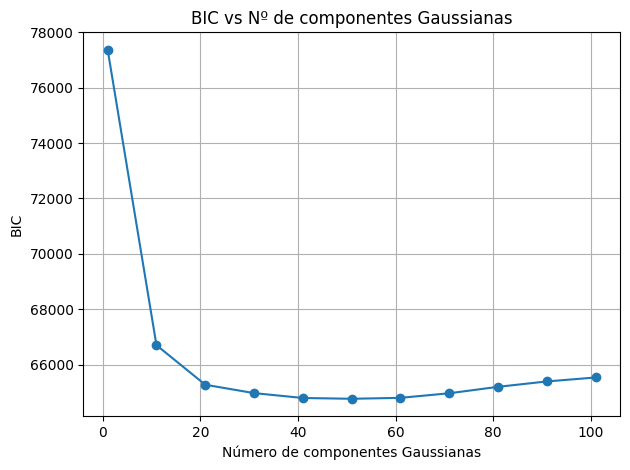

In [7]:
first = GmmPca(X, subsample=5_000, pca_components=int(3), cov_type="tied")

first.number_gmm_components(gmm_components=np.arange(1, 111, 10))

A pesar de obtener mejores resultados con un número creciente de componentes, el decremento deja de ser notable a partir de las $10$ componentes, que coincide con el número de prendas en el dataset. Por lo tanto, vamos a quedarnos con $10$ componentes gaussianas.

In [8]:
first.select_gmm_comp(10)

c:\Users\david\Desktop\Automatic-Learning\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\david\Desktop\Automatic-Learning\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


Tiempo de entrenamiento: 0.33 segundos


### 2. c) Generación y visualización de imágenes

Ahora vamos a generar tres muestras aleatoria por cada componente de `GMM` y visualizar la imagen reconstruida. Primero, imprimimos las tres componentes:

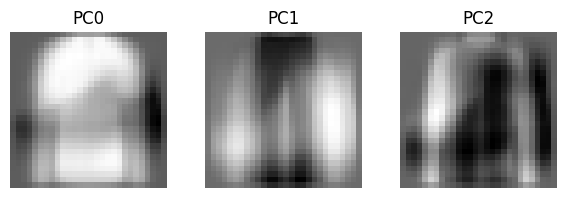

In [9]:
# Visualización de las tres primeras componentes PCA
first.visualize_pca_comp(idx=np.arange(3))

Ahora, imprimimos una muestra de cada componente:

(3, 3)


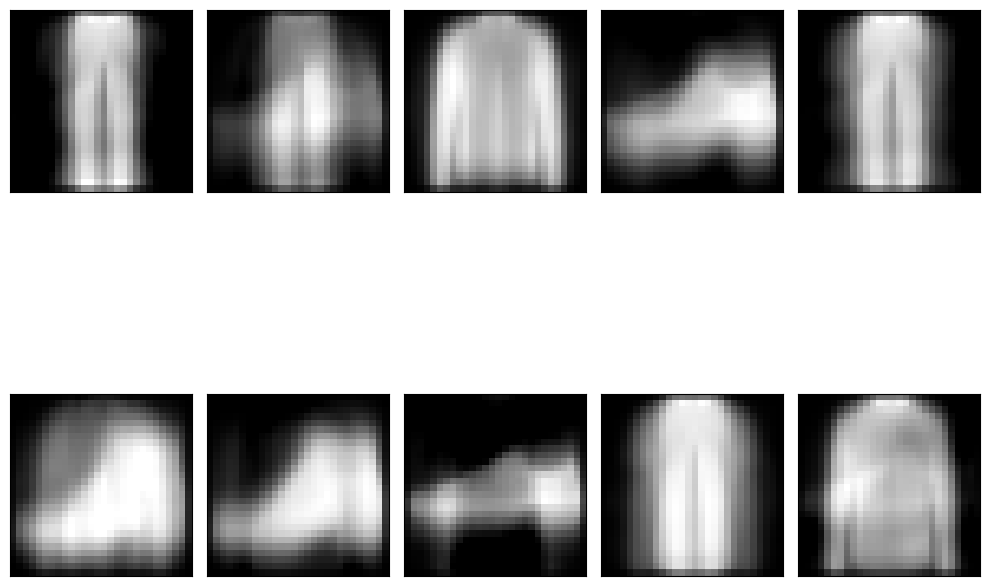

In [10]:
first.visualize_samples_gmm(
    n_images_per_component=1,
    multiple_cov_mat=False,
    is_diagonal=False,
    ncols=5
)

Aquí concluimos:
- Al haber elegido pocas componentes en PCA, las componentes no están capturando la variabilidad de todas las prendas. 
- Además, las muestras al tener que ser reconstruidas, se están mezclando diferentes prendas, ya que las componenetes principales lo hacen.

### 2. d) Genera y visualiza imágenes, empleando una única componente Gaussiana

Ahora vamos a samplear 20 muestras diferentes de una componente en concreto

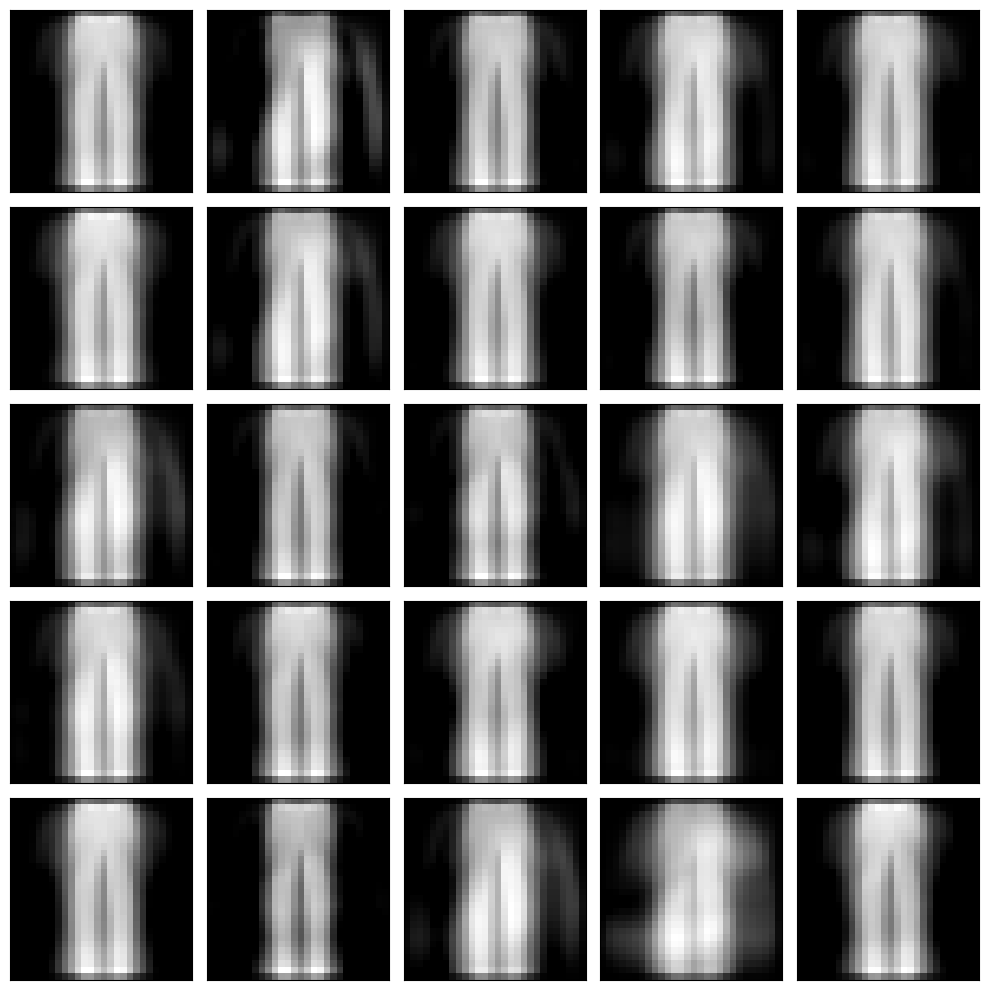

In [11]:
first.visualize_samples_one_component(
    id_component=0,
    num_samples=25,
    multiple_cov_mat=False,
    ncols=5
)

Esta primera componente, parece estar agrupando las imágenes relativas a los pantalones.

### 2. e) Visualización 3D

Visualiza en 3D el GMM ajustado empleando la función `plotly_gmm_results_3d` definida al <br> 
inicio del notebook.

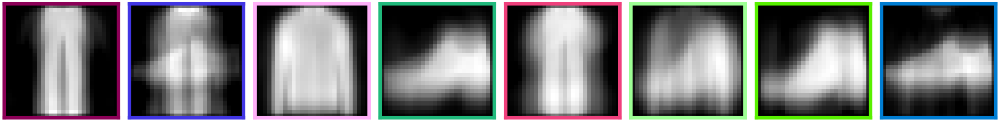

In [12]:
first.plot3d()

Aquí:
- Se está realizando el ajuste en 3 dimensiones (las tres componentes).
- Es posible que la suposición de matrices de covarianza idénticas sea muy restrictiva para clasificar los datos, haciendo que haya bastante intersección entre posibles clases distintas.

### 2. f) Ajuste de GMM con un mayor (y apropiado) número de componentes principales

Ahora vamos a realizar lo mismo cambiando el número de componentes para que expliquen el 80% de la varianza.

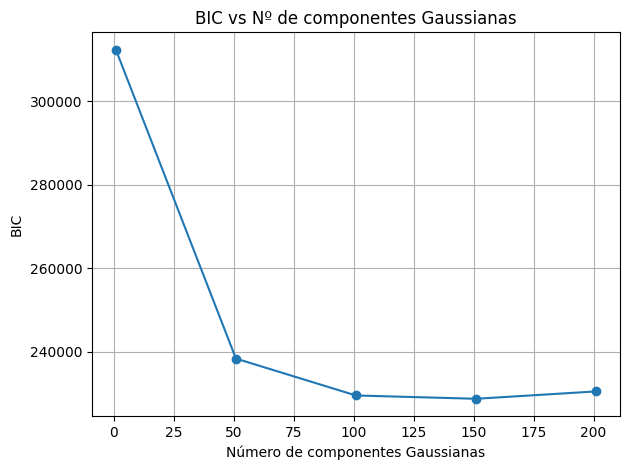

In [13]:
second = GmmPca(X, subsample=5_000, pca_components=float(0.8), cov_type="tied")
second.number_gmm_components(gmm_components=np.arange(1, 251, 50))

Ahora, podemos ver que, con 10 componenetes no es suficiente, por lo que vamos a elegir $150$ componentes.

Esto puede estar indicando que no se está ajustando satisfactoriamente por las restricciones tomadas (ya que teóricamente hay 10 componentes).


In [14]:
second.select_gmm_comp(150)

Tiempo de entrenamiento: 5.88 segundos


Ahora mostramos $25$ muestras aleatorias de la primera componente

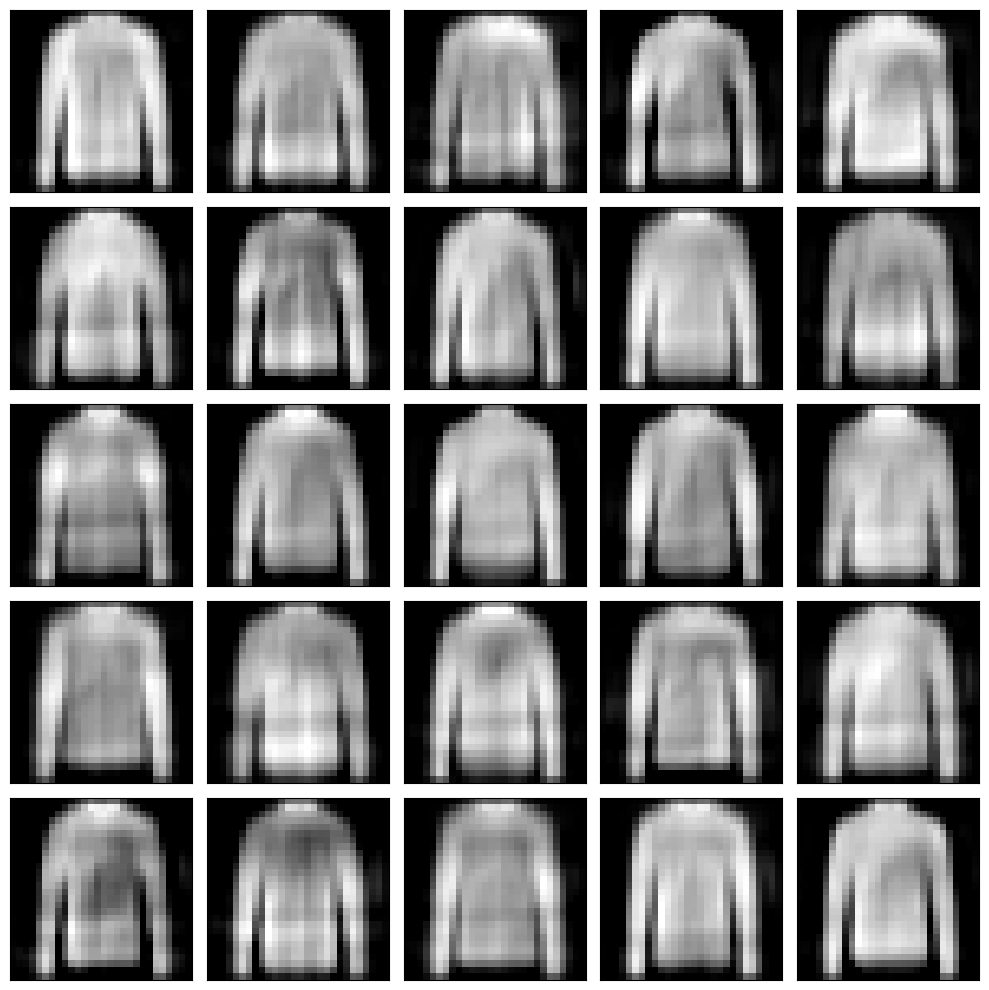

In [15]:
second.visualize_samples_one_component(
    id_component=10,
    num_samples=25,
    multiple_cov_mat=False,
    ncols=5
)

Parece haber agrupado las imágenes correspondientes a las camisetas.

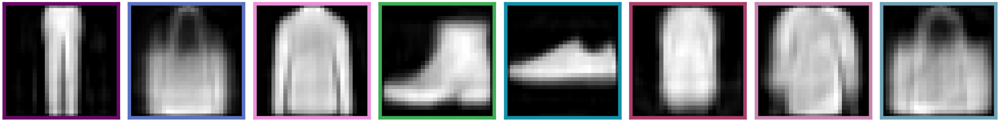

In [16]:
second.plot3d()

Como conclusiones:
- Al proyectarlo sobre las tres primeras componentes, vemos que muchas componentes en GMM representan clases muy parecidad.
- La suposición de las matrices de covarianza parece resultar muy restrictiva.

### 2. g) Análisis hiperparámetros GMM

#### 2.g.1 Número de componentes vs tipo de matrices de covarianza
Ahora vamos a probar el impacto de diferentes covarianzas, para analizar los resultados obtenidos. Vamos a analizarlo con:
- `full`: que asigna una matriz de covarianza única para cada componente.
- `tied` (ya hecho).
- `diag`: que supone que cada componente tiene una matriz de covarianza diagonal.


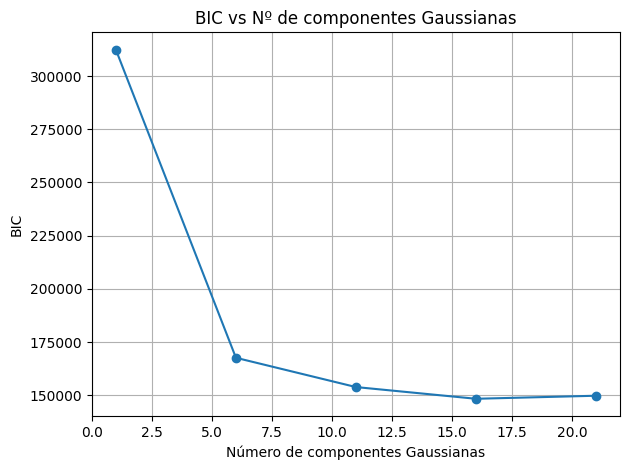

In [17]:
full_model = GmmPca(X, subsample=5_000, pca_components=float(0.8), cov_type="full")
full_model.number_gmm_components(gmm_components=np.arange(1, 26, 5))

Aquí:
- Al permitir a cada componente ajustarse mejor al modelo, no se necesitan tantas para explicar el modelo.
- Así, con 16 se obtiene el mejor BIC.

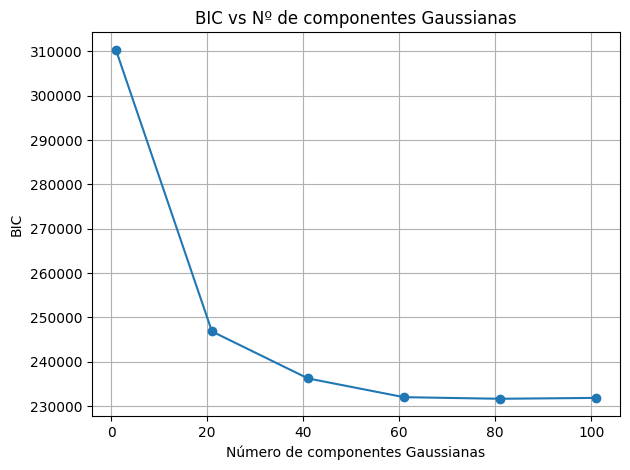

In [18]:
diag_model = GmmPca(X, subsample=5_000, pca_components=float(0.8), cov_type="diag")
diag_model.number_gmm_components(gmm_components=np.arange(1, 121, 20))

Aquí:
- Como se está dando una matriz de covarianza distinta a cada una de las componentes, se puede ajustar el modelo con $80$.
- Este número es mayor al obtenido con `full` debido a la suposición de diagonalidad, que restringe la capacidad de agrupación.

Ahora, vamos a muestrear utilizando estos dos modelos. Comenzamos con el full:

In [19]:
full_model.select_gmm_comp(16)

Tiempo de entrenamiento: 2.58 segundos


(16, 22, 22)


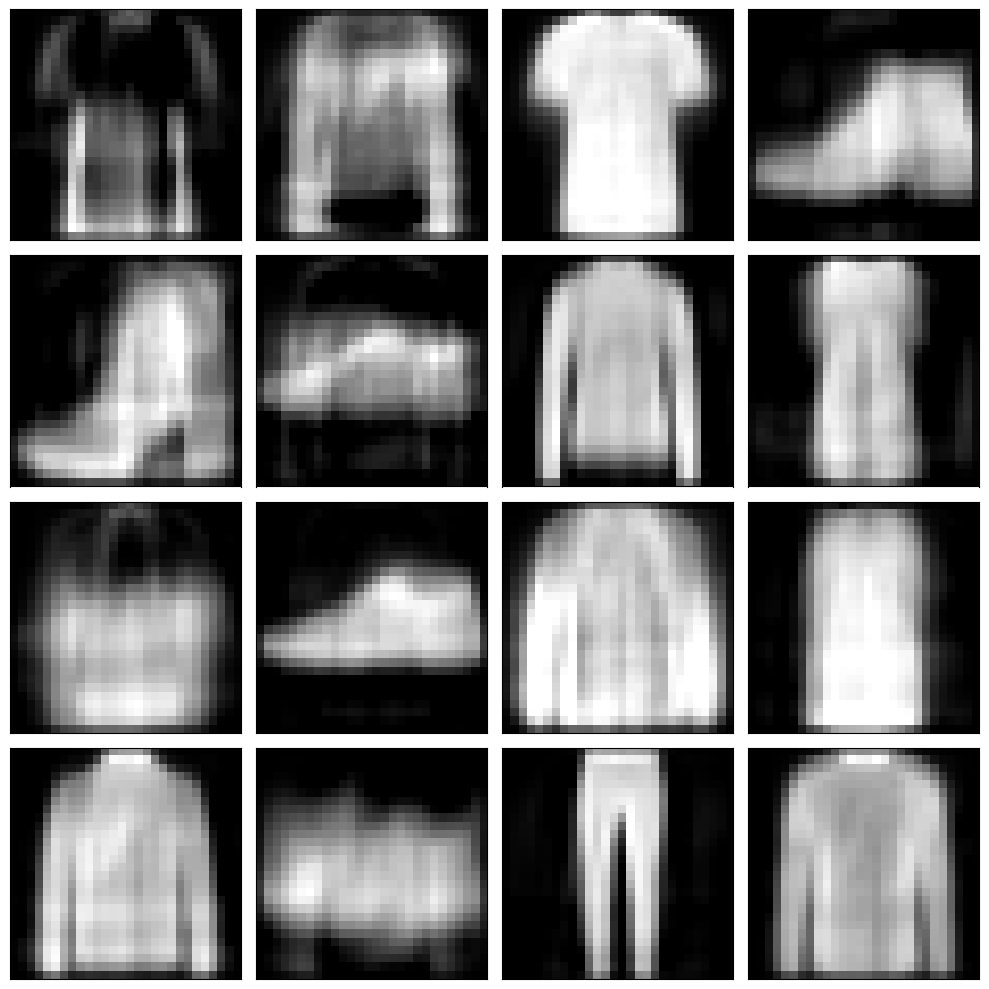

In [20]:
full_model.visualize_samples_gmm(
    n_images_per_component=1,
    multiple_cov_mat=True,
    ncols=4,
)

Aquí podemos observar que:
- Se ha reducido mucho el ruido presente en los anteriores modelos. Esto se puede deber a que las covarianzas se han ajustado mejor,
reduciendo la superposición entre diferentes clases.
- Cada componente, parece representar una ropa distinta, pudiendo observar todas las clases presentes.

También ploteamos en el espacio 3D:



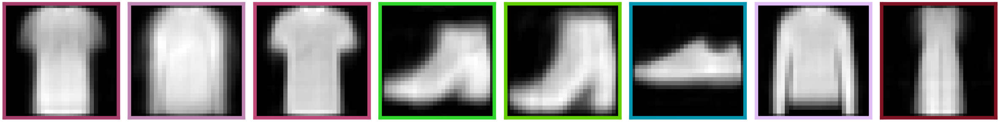

In [21]:
full_model.plot3d()

Continuamos con el modelo diagonal:

In [22]:
diag_model.select_gmm_comp(80)

Tiempo de entrenamiento: 1.53 segundos


(80, 22)


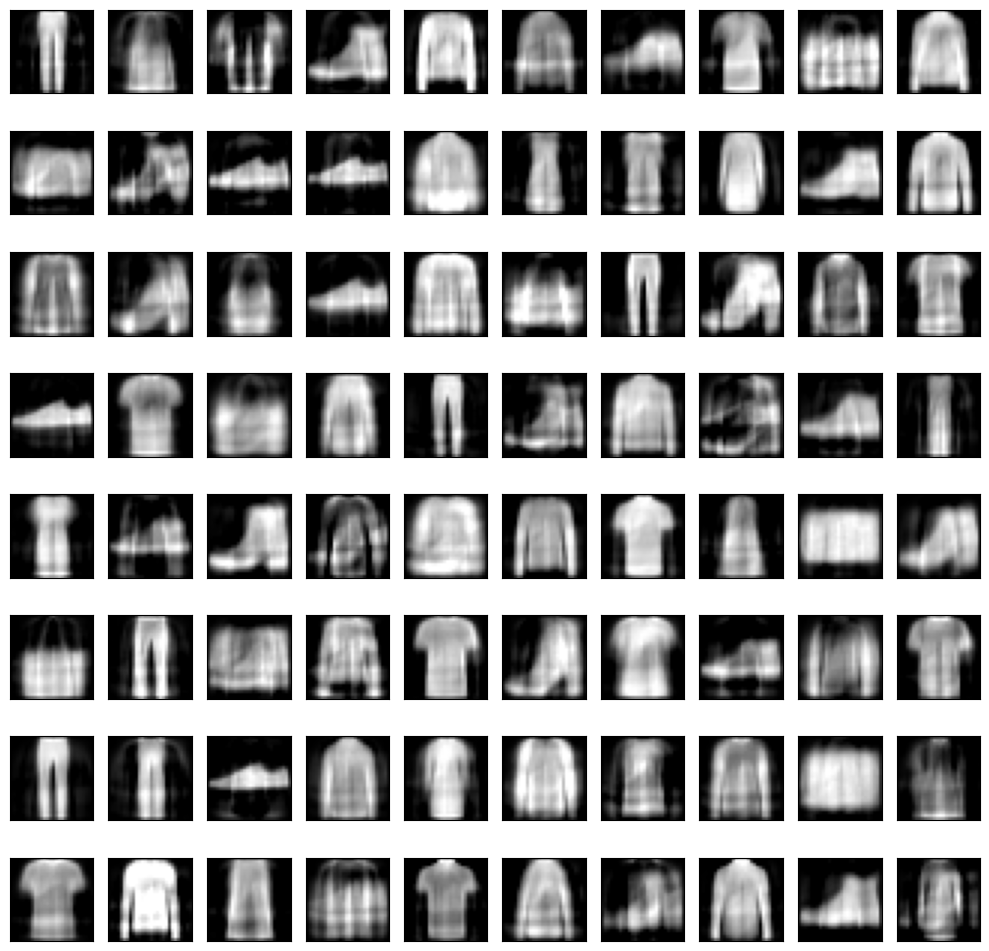

In [23]:
diag_model.visualize_samples_gmm(
    n_images_per_component=1,
    multiple_cov_mat=True,
    is_diagonal=True,
    ncols=10,
)

En este caso:
- A pesar de también encontrar muestras de cada uno de los tipos, hay muchas componentes que representan prendas muy similares, pudiendo indicar que el modelo puede simplificarse.

Por último, realizamos el plot3d.

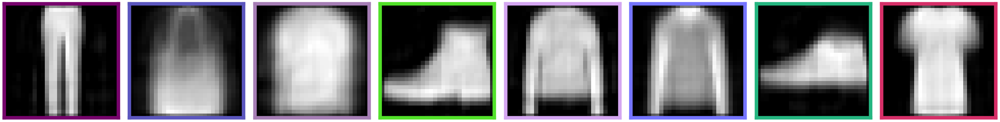

In [24]:
diag_model.plot3d()

Aquí:
- Ocurre algo similar al caso `tied`, donde al proyectar sobre las tres componentes, debido a las restricciones de diagonalidad, muchas componentes representan figuras muy similares.

#### 2.g.2 Tamaño subconjunto vs BIC

Ahora vamos a ver cómo afecta al BIC el tamaño del subconjunto elegido y por ende, al número de componentes gaussianas elegidas.

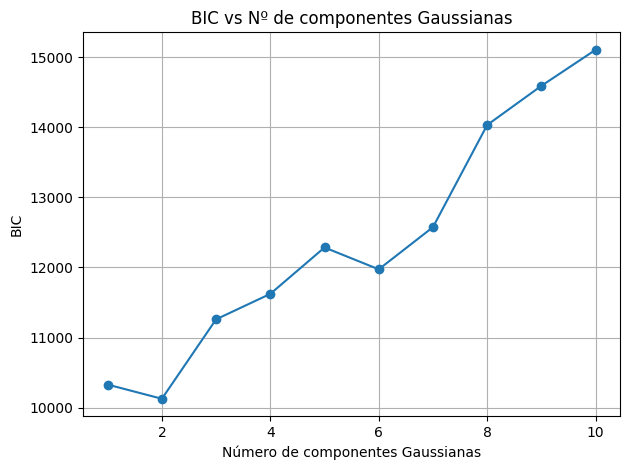

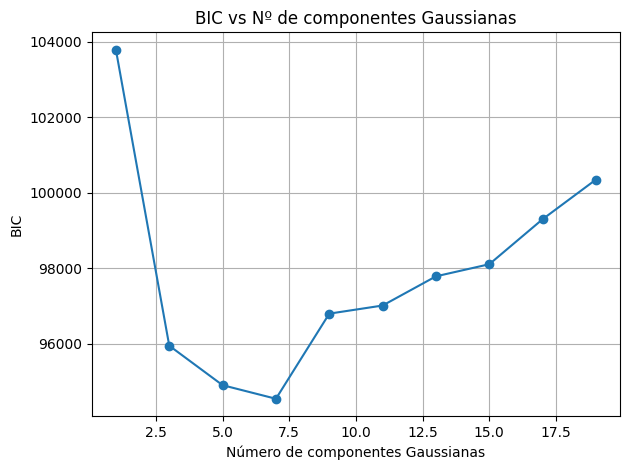

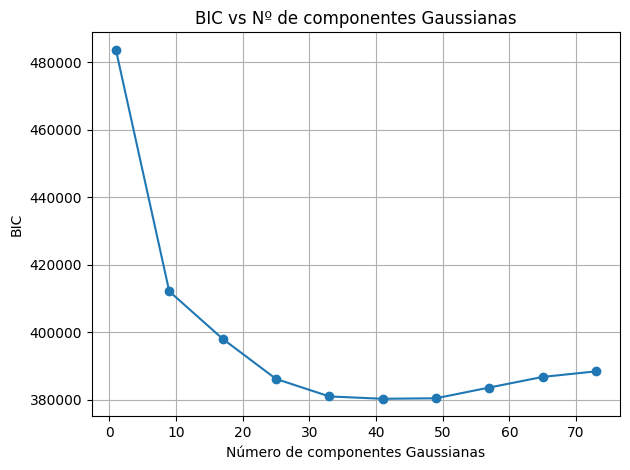

In [30]:
num_components = [100, 1000, 5000]
ranges = [np.arange(1, 11, 1), np.arange(1, 21, 2), np.arange(1, 81, 8)]
mat = 'diag'
models = []
n_components = 100


for i in range(3):
    model = GmmPca(X, subsample=num_components[i], pca_components=100, cov_type=mat)
    model.number_gmm_components(gmm_components=ranges[i])
    models.append(model)



Al añadir más muestras:
- Se necesitan más componentes en general debido a que hay más muestras que agrupar.
- Así, el BIC empieza a aumentar antes, ya que el aumento de la complejidad no logra contrarestar la mejora en el ajuste.
- Obviamente, aumenta el tiempo de ejecución.